# Libraries

In [1]:
import cv2
import time
import functools
import PIL.Image
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import tensorflow_hub as hub
import tensorflow as tf
import IPython.display as display

mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

# Load Data

In [2]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

In [3]:
def load_img(img_path):
    max_dim = 512
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

content_image = load_img('TIP.jpg')
content_image1 = load_img('TIP1.jpg')
style_image1 = load_img('ppicaso_2.jpg')
style_image2 = load_img('jluna_1.jpg')
style_image3 = load_img('jluna_2.jpg')
style_image4 = load_img('famorsolo_1.jfif')
style_image5 = load_img('pgauguin_1.jpg')
style_image6 = load_img('ppicaso_1.jpg')

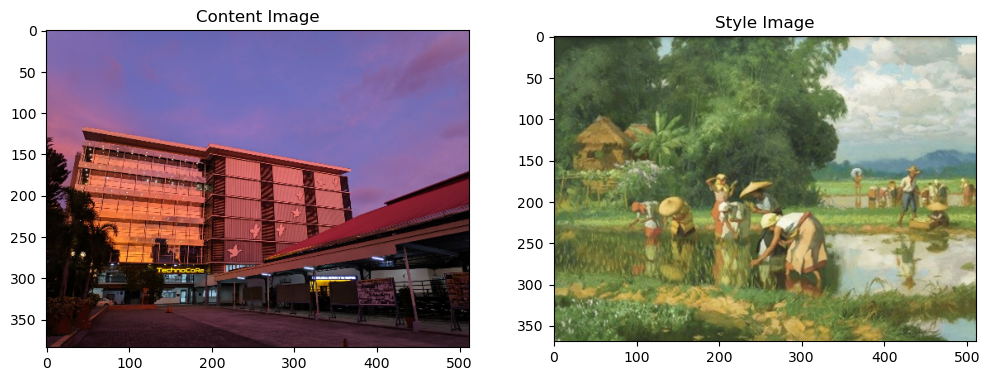

In [4]:
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image2, 'Style Image')

In [5]:
content_image.shape

TensorShape([1, 384, 512, 3])

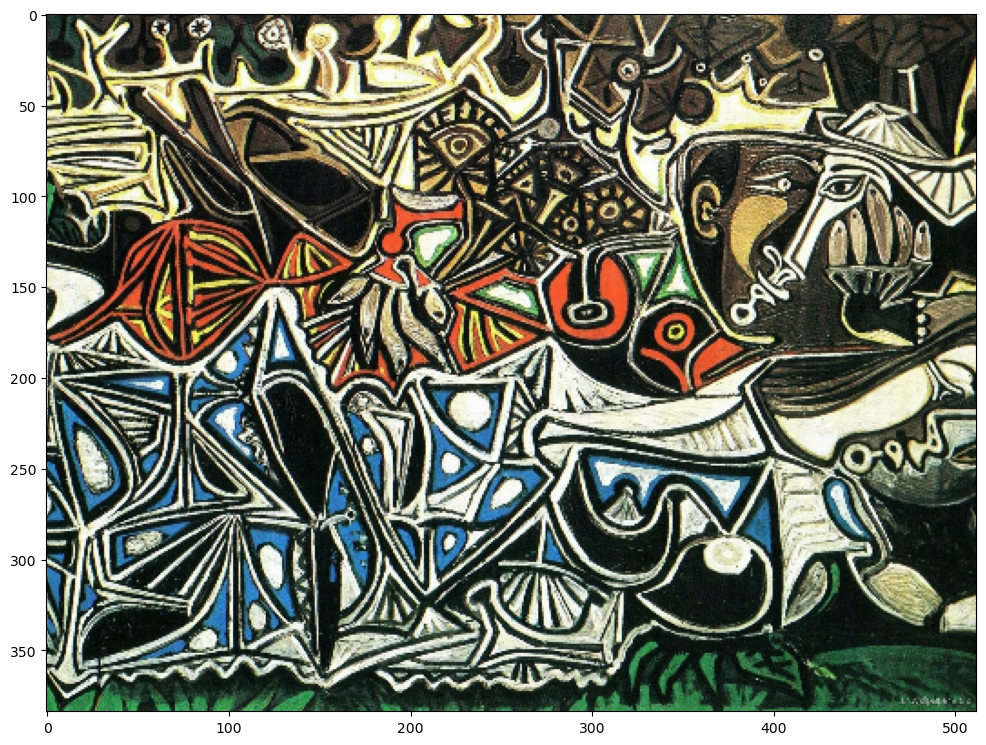

In [6]:
plt.imshow(np.squeeze(style_image1))
plt.imshow(np.squeeze(style_image2))
plt.imshow(np.squeeze(style_image3))
plt.imshow(np.squeeze(style_image4))
plt.imshow(np.squeeze(style_image5))
plt.imshow(np.squeeze(style_image6))

In [7]:
stylized_image1 = model(tf.constant(content_image), tf.constant(style_image1))[0]
stylized_image11 = model(tf.constant(content_image1), tf.constant(style_image1))[0]

stylized_image2 = model(tf.constant(content_image), tf.constant(style_image2))[0]
stylized_image22 = model(tf.constant(content_image1), tf.constant(style_image2))[0]

stylized_image3 = model(tf.constant(content_image), tf.constant(style_image3))[0]
stylized_image33 = model(tf.constant(content_image1), tf.constant(style_image3))[0]

stylized_image4 = model(tf.constant(content_image), tf.constant(style_image4))[0]
stylized_image44 = model(tf.constant(content_image1), tf.constant(style_image4))[0]

stylized_image5 = model(tf.constant(content_image), tf.constant(style_image5))[0]
stylized_image55 = model(tf.constant(content_image1), tf.constant(style_image5))[0]

stylized_image6 = model(tf.constant(content_image), tf.constant(style_image6))[0]
stylized_image66 = model(tf.constant(content_image1), tf.constant(style_image6))[0]

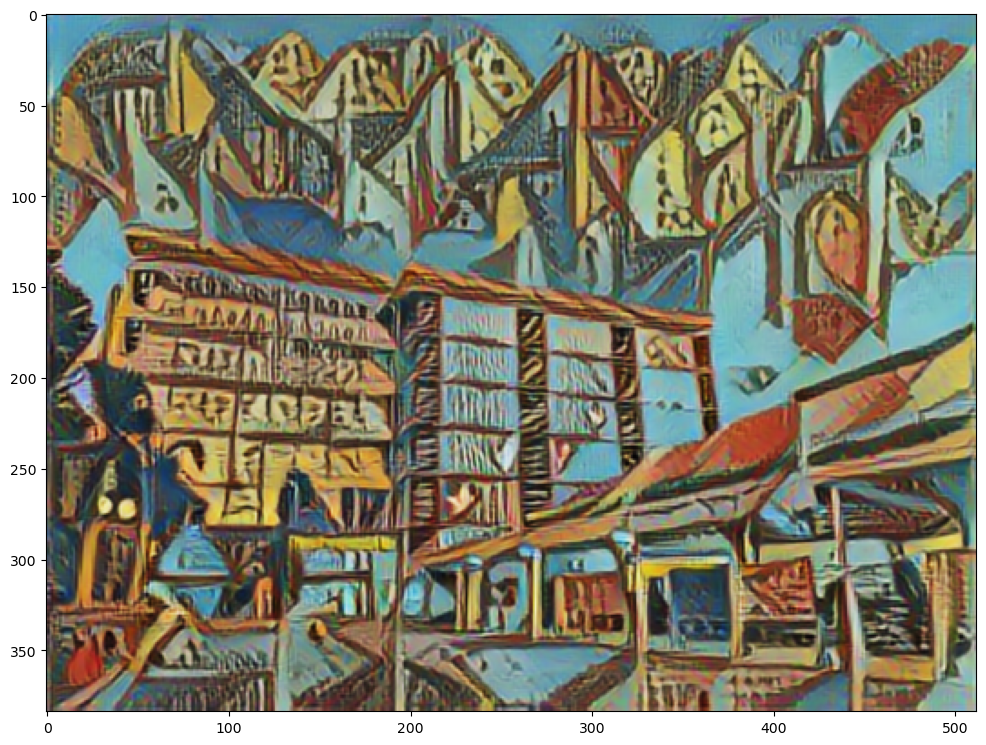

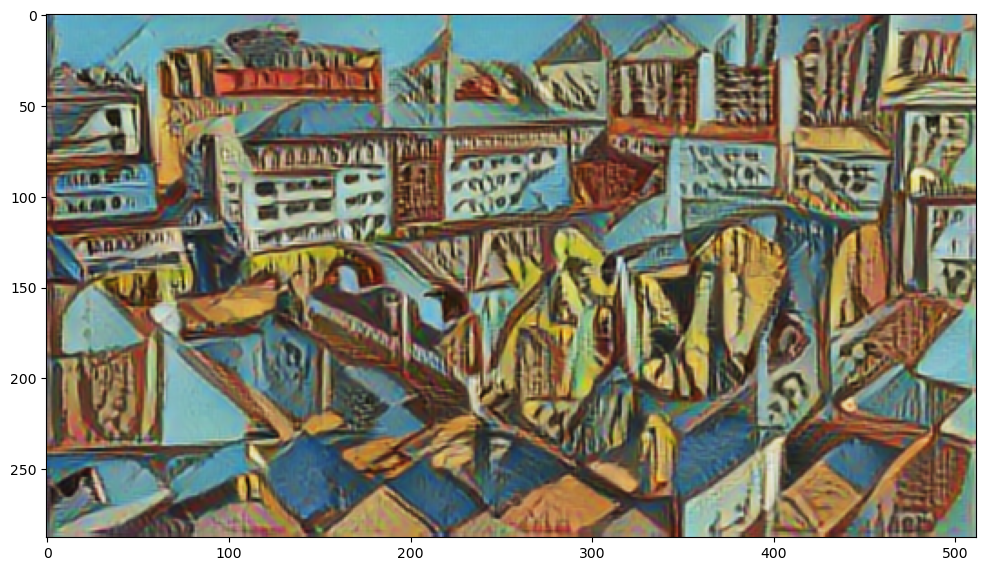

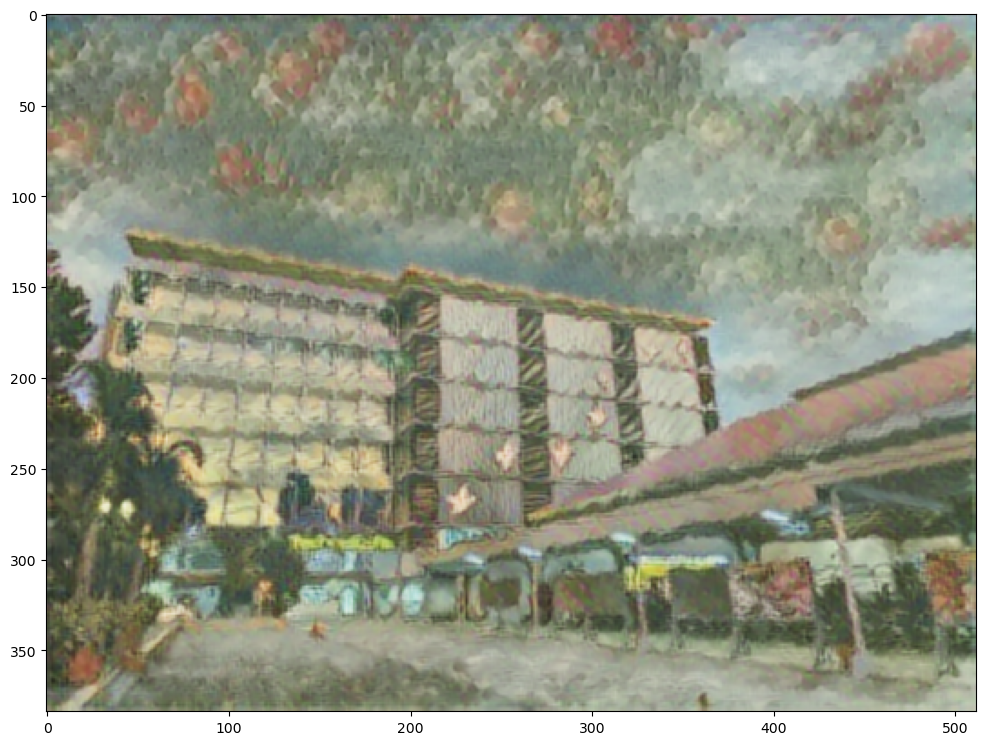

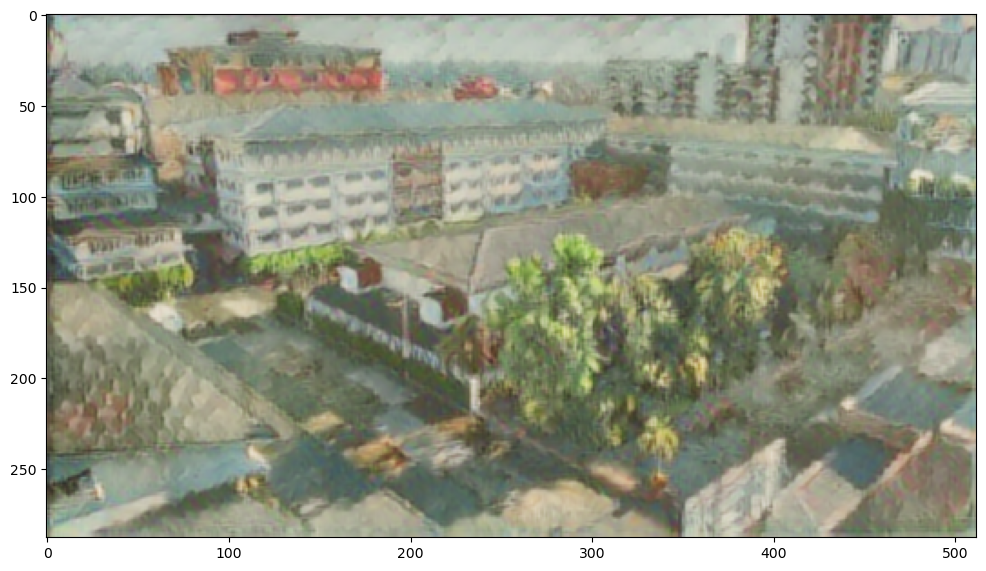

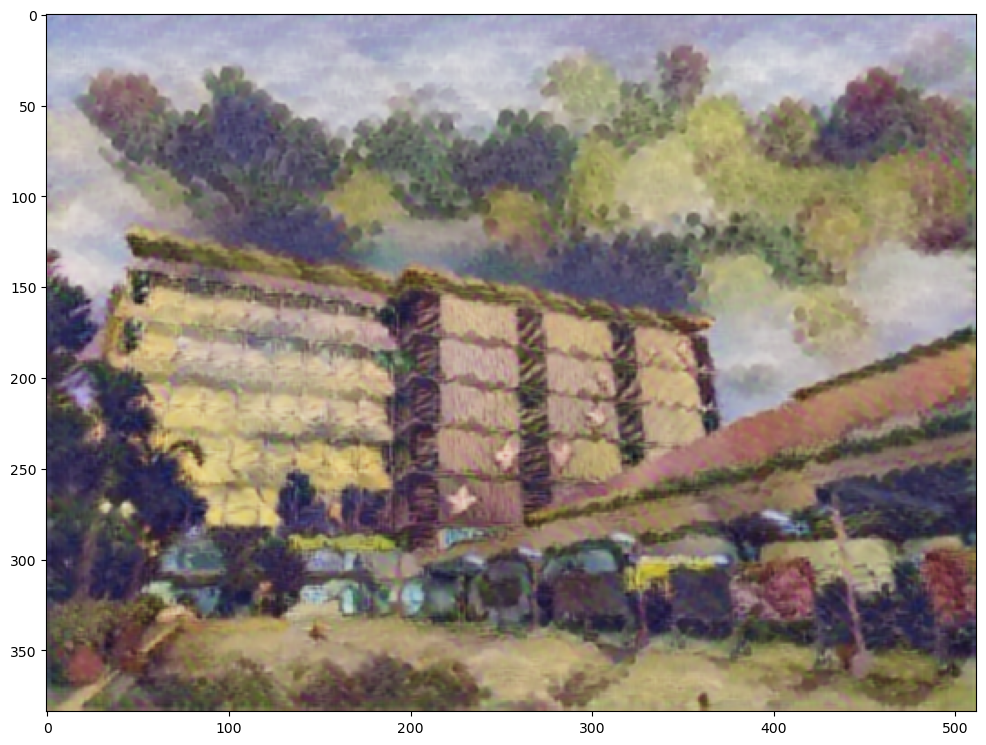

...

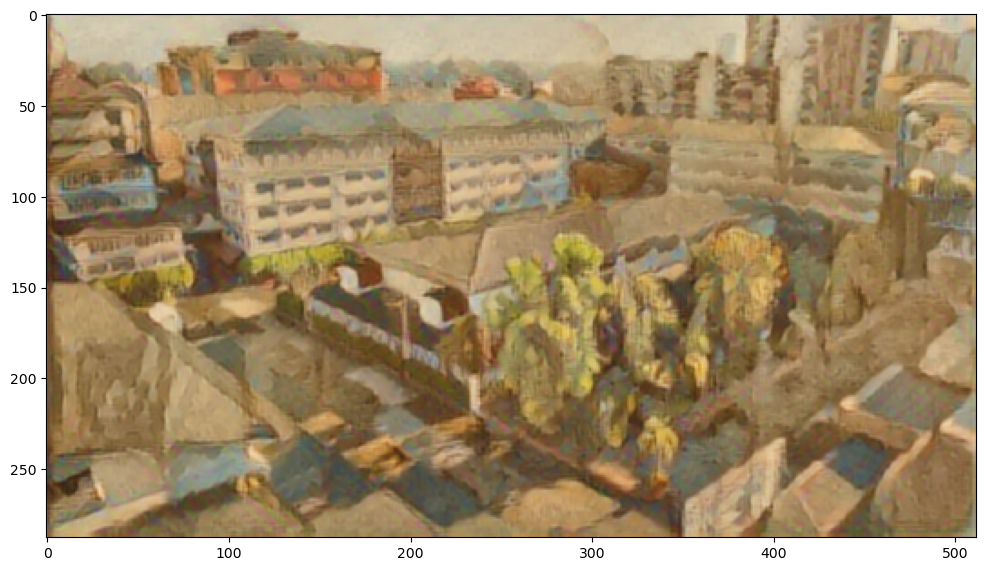

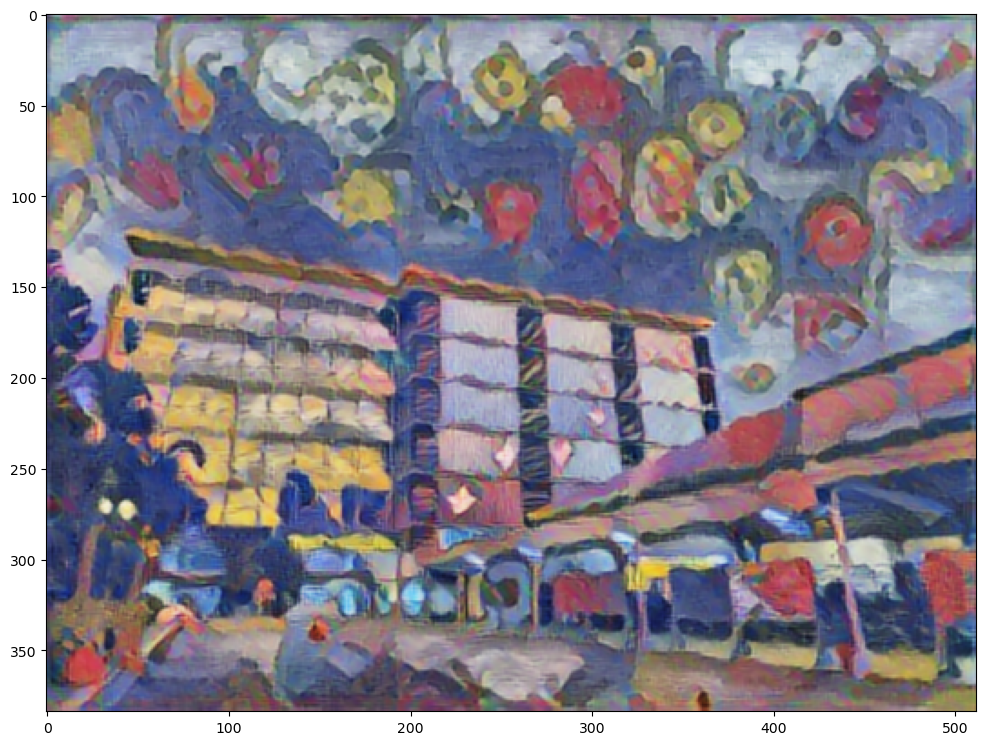

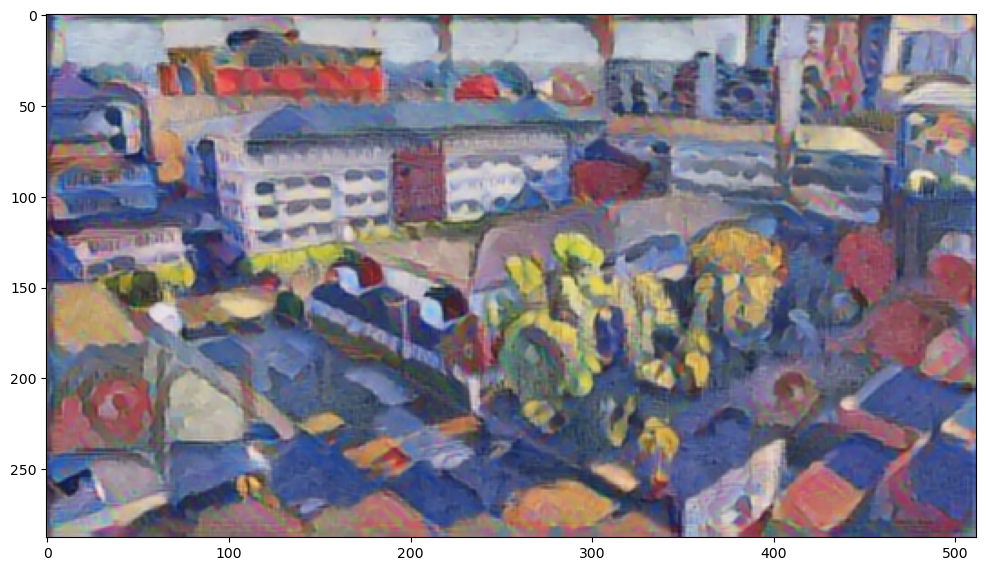

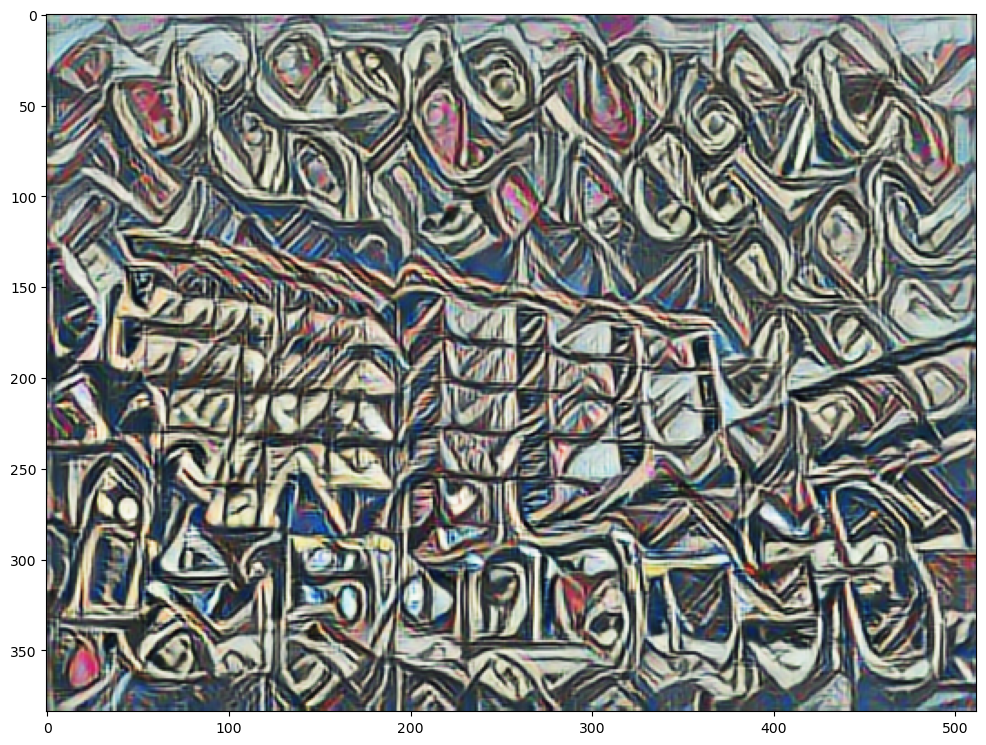

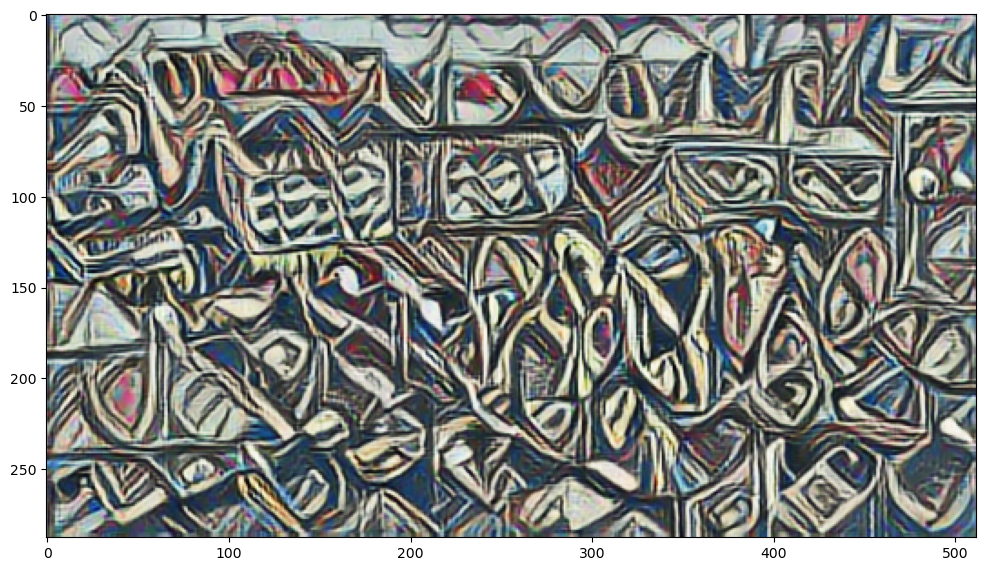

In [8]:
plt.imshow(np.squeeze(stylized_image1))
plt.show()
plt.imshow(np.squeeze(stylized_image11))
plt.show()

plt.imshow(np.squeeze(stylized_image2))
plt.show()
plt.imshow(np.squeeze(stylized_image22))
plt.show()

plt.imshow(np.squeeze(stylized_image3))
plt.show()
plt.imshow(np.squeeze(stylized_image33))
plt.show()

plt.imshow(np.squeeze(stylized_image4))
plt.show()
plt.imshow(np.squeeze(stylized_image44))
plt.show()

plt.imshow(np.squeeze(stylized_image5))
plt.show()
plt.imshow(np.squeeze(stylized_image55))
plt.show()

plt.imshow(np.squeeze(stylized_image6))
plt.show()
plt.imshow(np.squeeze(stylized_image66))
plt.show()

cv2.imwrite('generated_img.jpg', cv2.cvtColor(np.squeeze(stylized_image)*255, cv2.COLOR_BGR2RGB))